# Import

In [1]:
import os
import pandas as pd
from penquins import Kowalski
from tqdm import tqdm
import numpy as np
import dotenv

dotenv.load_dotenv()

True

# Example for an object

In [5]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
from penquins import Kowalski
import multiprocessing

# Constants
BASE_PATH = '/media/theob/E1/ML_project_data/data_kowalski/'
DATA_PATH = 'data/BTS.csv'
BATCH_SIZE = 16
KOWALSKI_HOST = 'kowalski.caltech.edu'
KOWALSKI_PORT = 443

def ensure_directory_exists(path):
    """Ensure the base directory exists."""
    if not os.path.exists(path):
        try:
            os.makedirs(path)
            print(f"Created base directory: {path}")
        except PermissionError as e:
            print(f"Permission denied: {e}")
            exit()

def get_kowalski_instance():
    """Initialize and return a Kowalski instance."""
    kowalski_token = os.getenv("KOWALSKI_API_TOKEN")
    instances = {
        'kowalski': {
            'protocol': 'https',
            'port': KOWALSKI_PORT,
            'host': KOWALSKI_HOST,
            'token': kowalski_token
        }
    }
    return Kowalski(instances=instances)

def check_kowalski_connection(k):
    """Check the connection to Kowalski."""
    if k.ping(name="kowalski"):
        print("Connected to Kowalski")
    else:
        print("Unable to connect to Kowalski")
        exit()

def load_bts_data(data_path):
    """Load BTS data from a CSV file."""
    df_bts = pd.read_csv(data_path)
    return sorted(list(set(df_bts["ZTFID"])))

def divide_chunks(lst, n):
    """Divide a list into chunks of size n."""
    for i in range(0, len(lst), n):
        yield lst[i:i + n]

def create_queries(obj_id):
    """Create queries for a given object ID."""
    query_alerts = {
        "query_type": "find",
        "query": {
            "catalog": 'ZTF_alerts',
            "filter": {"objectId": obj_id},
            "projection": {
                "_id": 0,
                "objectId": 1,
                "candidate": 1,
                "cutoutScience": 1,
                "cutoutTemplate": 1,
                "cutoutDifference": 1,
            },
        },
    }
    query_alerts_aux = {
        "query_type": "find",
        "query": {
            "catalog": "ZTF_alerts_aux",
            "filter": {"_id": obj_id},
            "projection": {"prv_candidates": 1},
        },
    }
    return query_alerts, query_alerts_aux

def save_alerts(obj_id, data, base_path):
    """Save alerts data to a file."""
    objDirectory = os.path.join(base_path, obj_id)
    if not os.path.exists(objDirectory):
        os.makedirs(objDirectory)
    alertsFile = os.path.join(objDirectory, 'alerts.npy')
    np.save(alertsFile, data)

def save_aux_alerts(obj_id, data, base_path):
    """Save auxiliary alerts data to a CSV file."""
    objDirectory = os.path.join(base_path, obj_id)
    if not os.path.exists(objDirectory):
        os.makedirs(objDirectory)
    photo = data['prv_candidates']
    photo_df = pd.DataFrame(photo)
    photo_df['obj_id'] = obj_id
    photo_df.to_csv(os.path.join(objDirectory, 'photometry.csv'), index=False)

def process_responses(responses, base_path):
    """Process responses from Kowalski and save data."""
    for response in responses["kowalski"]:
        if response["status"] == "success":
            data = response["data"]
            if not data:
                continue
            if "objectId" in data[0]:
                obj_id = data[0]["objectId"]
                save_alerts(obj_id, data, base_path)
            elif "prv_candidates" in data[0]:
                obj_id = data[0]["_id"]
                save_aux_alerts(obj_id, data[0], base_path)

def is_object_processed(obj_id, base_path):
    """Check if the object has already been processed by looking for the files."""
    objDirectory = os.path.join(base_path, obj_id)
    alertsFile = os.path.join(objDirectory, 'alerts.npy')
    photometryFile = os.path.join(objDirectory, 'photometry.csv')
    return os.path.exists(alertsFile) and os.path.exists(photometryFile)

def main():
    ensure_directory_exists(BASE_PATH)
    k = get_kowalski_instance()
    check_kowalski_connection(k)

    objIds = load_bts_data(DATA_PATH)
    num_threads = multiprocessing.cpu_count()
    print(f"Number of threads: {num_threads}")
    total_objects = len(objIds)
    print(f"Total number of objects: {total_objects}")

    batches = list(divide_chunks(objIds, BATCH_SIZE))

    for batch in tqdm(batches, desc="Processing batches"):
        queries = []

        for obj_id in batch:
            # if is_object_processed(obj_id, BASE_PATH):
            #     continue
            query_alerts, query_alerts_aux = create_queries(obj_id)
            queries.append(query_alerts)
            #queries.append(query_alerts_aux)

        responses = k.query(queries=queries, use_batch_query=True, max_n_threads=num_threads)
        process_responses(responses, BASE_PATH)

In [6]:
main()

Connected to Kowalski
Number of threads: 8
Total number of objects: 14153


Processing batches: 100%|██████████| 885/885 [51:08<00:00,  3.47s/it]  


In [4]:
origin_photo = pd.read_csv('data/photometry_Other_SN_I_SN_II.csv')

In [5]:
origin_photo

,obj_id,mjd,mag,magerr,snr,limiting_mag,filter,type
0,ZTF17aaaeqms,60081.478391,NaN,NaN,NaN,18.918100,ztfr,Other
1,ZTF17aaaeqms,60081.480752,NaN,NaN,NaN,19.038200,ztfr,Other
2,ZTF17aaaeqms,60081.483125,NaN,NaN,NaN,18.864799,ztfr,Other
3,ZTF17aaaeqms,60081.485486,NaN,NaN,NaN,18.842501,ztfr,Other
4,ZTF17aaaeqms,60081.487859,NaN,NaN,NaN,18.709999,ztfr,Other
...,...,...,...,...,...,...,...,...
4118620,ZTF24aahdisu,60389.506169,18.818848,0.093825,11.571978,19.729942,ztfr,Other
4118621,ZTF24aahdisu,60389.506169,18.818800,0.093825,11.571929,19.729889,ztfr,Other
4118622,ZTF24aahdisu,60389.506169,18.791941,0.032035,33.892427,20.869772,ztfr,Other
4118623,ZTF24aahdisu,60391.263009,NaN,NaN,NaN,18.093500,ztfr,Other


In [6]:
df_bts = pd.read_csv('data/BTS.csv')
df_bts.head()

,ZTFID,IAUID,RA,Dec,peakt,peakfilt,peakmag,peakabs,duration,rise,fade,type,redshift,b,A_V
0,ZTF17aaaeqms,AT2023jkf,01:19:13.43,+31:46:26.1,2102.97,r,17.5839,-,18.001,12.004,5.997,-,-,-30.726791,0.205
1,ZTF17aaajowi,-,11:47:44.37,+14:34:10.4,1362.73,r,18.9963,-,>5.611,2.651,>2.96,-,-,70.564727,0.127
2,ZTF17aaanztg,AT2021abaw,10:04:06.59,-01:12:18.6,1501.02,r,18.3035,-,>14.737,>3,11.737,-,-,40.798120,0.210
3,ZTF17aaaocnx,AT2019dlf,06:12:54.20,+48:49:57.0,584.70,g,17.2290,-,6.213,0.803,5.41,-,-,14.194943,0.407
4,ZTF17aaaptxx,AT2023gdf,11:54:24.96,+09:36:32.8,2053.73,g,18.9437,-,>2,>2,>0,-,-,67.910221,0.079


In [9]:
def clean_photometry(df, df_type):
    # rename magpsf to mag
    df = df.rename(columns={'magpsf': 'mag'})
    # rename sigmapsf to magerr
    df = df.rename(columns={'sigmapsf': 'magerr'})
    # rename fid to filter
    df = df.rename(columns={'fid': 'filter'})
    df['filter'] = df['filter'].replace({1: 'ztfg', 2: 'ztfr', 3: 'ztfi'})

    # rename scorr to snr
    df = df.rename(columns={'scorr': 'snr'})

    # rename diffmaglim to limiting_mag
    df = df.rename(columns={'diffmaglim': 'limiting_mag'})

    # rename jd to mjd, mjd = jd - 2400000.5
    df['mjd'] = df['jd'] - 2400000.5
    
    df = df[['obj_id', 'jd', 'mjd', 'mag', 'magerr', 'snr', 'limiting_mag', 'filter']]

    df_type = df_type.rename(columns={'ZTFID': 'obj_id'})
    df = df.merge(df_type[['obj_id', 'type']], on='obj_id', how='left')

    # si mag Nan alors on supprime la ligne
    df = df.dropna(subset=['mag', 'magerr'])
    df = df.reset_index(drop=True)

    return df

In [10]:
photo_df = pd.read_csv(os.path.join(objDirectory, 'photometry.csv'))
photo_df

,jd,fid,pid,diffmaglim,pdiffimfilename,programpi,programid,nid,rcid,field,...,nneg,nbad,rb,sumrat,magapbig,sigmagapbig,ranr,decnr,scorr,obj_id
0,2.460082e+06,2,2327478391915,18.918100,/ztf/archive/sci/2023/0517/478356/ztf_20230517...,Prince,1,2327,19,650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ZTF17aaaeqms
1,2.460082e+06,2,2327480751915,19.038200,/ztf/archive/sci/2023/0517/480752/ztf_20230517...,Prince,1,2327,19,650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ZTF17aaaeqms
2,2.460082e+06,2,2327483121915,18.864799,/ztf/archive/sci/2023/0517/483113/ztf_20230517...,Prince,1,2327,19,650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ZTF17aaaeqms
3,2.460082e+06,2,2327485481915,18.842501,/ztf/archive/sci/2023/0517/485486/ztf_20230517...,Prince,1,2327,19,650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ZTF17aaaeqms
4,2.460082e+06,2,2327487851915,18.709999,/ztf/archive/sci/2023/0517/487859/ztf_20230517...,Prince,1,2327,19,650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ZTF17aaaeqms
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305,2.460109e+06,2,2354461043015,19.621300,/ztf/archive/sci/2023/0613/461030/ztf_20230613...,Prince,1,2354,30,651,...,1.0,0.0,0.847143,1.000000,18.558701,0.1520,19.805986,31.773992,14.01480,ZTF17aaaeqms
306,2.460109e+06,2,2354463063015,19.819401,/ztf/archive/sci/2023/0613/463056/ztf_20230613...,Prince,1,2354,30,651,...,0.0,0.0,0.904286,1.000000,18.105700,0.1013,19.805986,31.773992,7.04882,ZTF17aaaeqms
307,2.460109e+06,2,2354465093015,19.811001,/ztf/archive/sci/2023/0613/465081/ztf_20230613...,Prince,1,2354,30,651,...,0.0,0.0,0.895714,1.000000,18.201099,0.1109,19.805986,31.773992,9.91825,ZTF17aaaeqms
308,2.460112e+06,2,2357462333015,20.282801,/ztf/archive/sci/2023/0616/462338/ztf_20230616...,Prince,1,2357,30,651,...,4.0,0.0,0.860000,0.972349,18.747299,0.1513,19.805986,31.773992,12.27410,ZTF17aaaeqms


In [11]:
photo_df_after = clean_photometry(photo_df, df_bts)
photo_df_after.head(60)

,obj_id,jd,mjd,mag,magerr,snr,limiting_mag,filter,type
0,ZTF17aaaeqms,2.460088e+06,60087.478935,18.860100,0.162338,9.59786,19.329100,ztfr,-
1,ZTF17aaaeqms,2.460089e+06,60088.476968,18.333401,0.092138,7.81325,19.375900,ztfr,-
2,ZTF17aaaeqms,2.460089e+06,60088.479340,18.568899,0.100185,5.35912,19.376600,ztfr,-
3,ZTF17aaaeqms,2.460089e+06,60088.481725,18.800800,0.200047,6.72864,19.134600,ztfr,-
4,ZTF17aaaeqms,2.460089e+06,60088.484097,18.588699,0.145916,5.25657,18.964001,ztfr,-
5,ZTF17aaaeqms,2.460090e+06,60089.478229,18.526800,0.120187,7.56319,19.410999,ztfr,-
6,ZTF17aaaeqms,2.460090e+06,60089.478229,18.526800,0.120187,7.56319,19.410999,ztfr,-
7,ZTF17aaaeqms,2.460090e+06,60089.482974,18.419500,0.136885,5.37508,18.995199,ztfr,-
8,ZTF17aaaeqms,2.460091e+06,60090.474850,18.333099,0.132279,8.63236,19.109501,ztfr,-
9,ZTF17aaaeqms,2.460091e+06,60090.477234,18.191799,0.154973,5.57284,19.072701,ztfr,-


In [12]:
import plotly.graph_objs as go
import pandas as pd
import numpy as np

def plot_photometry(lc, color_dict=None):
    if color_dict is None:
        color_dict = {
            'ztfg': 'green', 'ztfr': 'red', 'ztfi': 'yellow',
            'sdssg': 'green', 'sdssr': 'red', 'sdssi': 'yellow',
            'atlasc': 'cyan', 'atlaso': 'orange'
        }
    
    fig = go.Figure()

    # Function to add trace to the figure
    def add_trace(data, name, color, symbol='circle', line_width=1, size=8, show_legend=True):
        fig.add_trace(go.Scatter(
            x=data['mjd'],
            y=data['mag'],
            error_y=dict(type='data', array=data['magerr'], visible=True),
            mode='markers',
            marker=dict(color=color, size=size, symbol=symbol, line=dict(width=line_width)),
            name=name,
            text=[
                f"MJD: {mjd}<br>Mag: {mag}<br>MagErr: {magerr}<br>SNR: {snr}" 
                for mjd, mag, magerr, snr in zip(data['mjd'], data['mag'], data['magerr'], data['snr'])
            ],
            legendgroup=name,
            showlegend=show_legend
        ))

    # Loop through each filter
    for f in lc['filter'].unique():
        filter_data = lc[lc['filter'] == f]
        
        detected = filter_data[filter_data['mag'] >= 3.0]
        upper_limits = filter_data[filter_data['snr'] < 3] if 'snr' in filter_data.columns else pd.DataFrame()
        
        add_trace(detected, f, color_dict[f])
        
        if not upper_limits.empty:
            upper_limits['mag'] = upper_limits['limiting_mag']  # Use limiting_mag for upper limits
            add_trace(upper_limits, f'{f} Upper Limits', color_dict[f], symbol='triangle-up-open', line_width=2, show_legend=False)

    fig.update_yaxes(autorange='reversed')
    fig.update_layout(
        title=f"{lc['obj_id'].iloc[0]} - {lc['type'].iloc[0]}",
        xaxis_title="MJD",
        yaxis_title="Magnitude (AB)",
        legend_title="Filter",
        hovermode='closest'
    )

    fig.show()

In [13]:
plot_photometry(photo_df_after)

In [28]:
import src.preprocessing.gaussian_process as g
import src.preprocessing.preprocessing_run as pr
import src.preprocessing.tools as tools

import importlib

importlib.reload(g)
importlib.reload(pr)

<module 'src.preprocessing.preprocessing_run' from '/home/theob/Documents/stage/ML_skyportal/src/preprocessing/preprocessing_run.py'>

In [15]:
df = pr.preprocess_data(photo_df_after)
df = pr.reset_data_indices(df)

df_gp_ready = pr.prepare_gp_input(df)

In [16]:
df_gp_ready

,obj_id,mjd,flux,flux_error,filter,type
0,ZTF17aaaeqms,0.000000,103.743306,15.511577,ztfr,?
1,ZTF17aaaeqms,0.998032,168.515444,14.300597,ztfr,?
2,ZTF17aaaeqms,1.000405,135.656416,12.517532,ztfr,?
3,ZTF17aaaeqms,1.002789,109.567025,20.187735,ztfr,?
4,ZTF17aaaeqms,1.005162,133.204919,17.901889,ztfr,?
...,...,...,...,...,...,...
155,ZTF17aaaeqms,20.982107,186.947764,13.705085,ztfr,?
156,ZTF17aaaeqms,20.984132,185.780289,16.133103,ztfr,?
157,ZTF17aaaeqms,20.986157,175.678999,14.544772,ztfr,?
158,ZTF17aaaeqms,23.983403,157.528675,13.459496,ztfr,?


In [30]:
df_gp_ready = tools.robust_scale(df_gp_ready, ['flux', 'flux_error'])

In [31]:
df_gp_ready

,obj_id,mjd,flux,flux_error,filter,type
0,ZTF17aaaeqms,0.000000,-2.062541,-0.547953,ztfr,?
1,ZTF17aaaeqms,0.998032,-0.970968,-0.767713,ztfr,?
2,ZTF17aaaeqms,1.000405,-1.524725,-1.091291,ztfr,?
3,ZTF17aaaeqms,1.002789,-1.964397,0.300642,ztfr,?
4,ZTF17aaaeqms,1.005162,-1.566039,-0.114177,ztfr,?
...,...,...,...,...,...,...
155,ZTF17aaaeqms,20.982107,-0.660338,-0.875782,ztfr,?
156,ZTF17aaaeqms,20.984132,-0.680013,-0.435163,ztfr,?
157,ZTF17aaaeqms,20.986157,-0.850245,-0.723402,ztfr,?
158,ZTF17aaaeqms,23.983403,-1.156123,-0.920350,ztfr,?


In [ ]:
# remove les extremes valeurs 

In [17]:
gp_input = pr.preprocess_photo(photo_df_after)

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


In [18]:
gp_input

,mjd,flux_ztfg,flux_ztfr,flux_error_ztfg,flux_error_ztfr,type,obj_id
0,0.000000,-0.384200,-0.351674,-0.239287,-0.636749,?,ZTF17aaaeqms
1,0.938757,-0.253801,-0.204762,-0.269273,-0.705589,?,ZTF17aaaeqms
2,1.877514,-0.124239,-0.073794,-0.281977,-0.699205,?,ZTF17aaaeqms
3,2.816271,-0.000628,0.075317,-0.286575,-0.700193,?,ZTF17aaaeqms
4,3.755028,0.113350,0.176773,-0.288138,-0.689251,?,ZTF17aaaeqms
...,...,...,...,...,...,...,...
95,89.181905,-0.485959,-0.491365,-0.906949,0.136022,?,ZTF17aaaeqms
96,90.120662,-0.541050,-0.539705,-1.185982,0.148941,?,ZTF17aaaeqms
97,91.059419,-0.589783,-0.582403,-1.521596,0.157032,?,ZTF17aaaeqms
98,91.998176,-0.633580,-0.620548,-1.873463,0.169776,?,ZTF17aaaeqms


In [42]:
def plot_gp(raw_df, gp_df):
    # Define the color dictionary
    color_dict = {'ztfg': 'rgba(0, 128, 0, 0.2)', 'ztfr': 'rgba(255, 0, 0, 0.2)'}
    line_color_dict = {'ztfg': 'rgba(0, 128, 0, 1.0)', 'ztfr': 'rgba(255, 0, 0, 1.0)'}
    
    fig = go.Figure()

    # Plot raw data points
    for filter_name in raw_df['filter'].unique():
        filter_data = raw_df[raw_df['filter'] == filter_name]
        fig.add_trace(go.Scatter(
            x=filter_data['mjd'],
            y=filter_data['flux'],
            mode='markers',
            name=f'Raw {filter_name}',
            marker=dict(color=line_color_dict[filter_name]),
            # error_y=dict(
            #     type='data',
            #     array=filter_data['flux_error'],
            #     visible=True
            # ),
            hovertemplate=(
                'mjd: %{x}<br>'
                'flux: %{y}<br>'
                # 'flux_error: %{marker.error_y.array}<br>'
                'filter: %{text}<br>'
                'obj_id: ' + filter_data['obj_id'].iloc[0]
            ),
            text=filter_data['filter']
        ))

    # Plot GP data with error bands
    for filter_name in ['ztfg', 'ztfr']:
        flux_col = f'flux_{filter_name}'
        error_col = f'flux_error_{filter_name}'
        
        fig.add_trace(go.Scatter(
            x=gp_df['mjd'],
            y=gp_df[flux_col],
            mode='lines',
            name=f'GP {filter_name}',
            line=dict(color=line_color_dict[filter_name])
        ))
        fig.add_trace(go.Scatter(
            x=gp_df['mjd'],
            y=gp_df[flux_col] + gp_df[error_col],
            mode='lines',
            line=dict(color=line_color_dict[filter_name].replace('1.0', '0')),
            showlegend=False,
            name=f'Upper Bound {filter_name}'
        ))
        fig.add_trace(go.Scatter(
            x=gp_df['mjd'],
            y=gp_df[flux_col] - gp_df[error_col],
            mode='lines',
            line=dict(color=line_color_dict[filter_name].replace('1.0', '0')),
            fill='tonexty',
            fillcolor=color_dict[filter_name],
            showlegend=False,
            name=f'Lower Bound {filter_name}'
        ))

    fig.update_layout(
        xaxis_title='Time (mjd)',
        yaxis_title='Flux',
        legend=dict(orientation='h')
    )

    if 'obj_id' in raw_df.columns:
        fig.update_layout(
            title=f'Light Curve for Object ID: {raw_df["obj_id"].iloc[0]}'
        )

    fig.show()

In [43]:
plot_gp(df_gp_ready, gp_input)

# Alertes

In [39]:
alertsFile = os.path.join(objDirectory, 'alerts.npy')
object_alerts = np.load(alertsFile, allow_pickle=True)

object_alerts

array([{'objectId': 'ZTF17aaaeqms', 'candidate': {'diffmaglim': 19.32908821105957, 'ra': 19.805806, 'dec': 31.7739727, 'magpsf': 18.860076904296875, 'sigmapsf': 0.16233842074871063, 'sharpnr': 0.6340000033378601, 'sky': 0.3661837875843048, 'fwhm': 1.2727702856063843, 'sgscore1': 0.1338990032672882, 'distpsnr1': 0.4932520389556885, 'ndethist': 17, 'ncovhist': 4288, 'scorr': 9.59785938262939, 'sgscore2': 0.5, 'distpsnr2': 2.835390090942383, 'nmtchps': 10, 'drb': 0.9873158931732178}, 'cutoutScience': {'fileName': 'candid2333478931915015006_pid2333478931915_targ_sci.fits.gz', 'stampData': b'\x1f\x8b\x08\x00*\xb4ld\x02\x03\xed\x9bitS\xe5\xdb\xeeSJ!@\x91\xc8\x18\x041(Hp\xc0\x08(QA\xe2\xf5\x80\x06\xfe\xa0AP\xa2\xa0DA\t\x8a\x18\x145"jT\xd0\xa8\x80\x11\x10\xc2\x1c\x06!L%Ph\xd3ywN\xe7\xdd6m\xd3ywN\xe7t\xa0\r\xb4\xc0\xb9\xf1|;\xeb\xfdr\xde\xf3\xae\xf3\xc9\xac\xc5\x12\x19\x92\xbd\xf7s\xdf\xd7\xf5\xfb\x15X\xbeh\xa9f\xc9B\x99l\x9eL\xb6B\xf6?\xf0\xc2\xa2\x15\x9aE\xda\x7f\xde\xef\xff|=9k\xe6\xff\xfd\x

In [40]:
from astropy.io import fits
import warnings
from astropy.utils.exceptions import AstropyWarning
import gzip
import io

def decompress_fits(data):
    compressed_data = gzip.decompress(data)
    with warnings.catch_warnings():
        warnings.simplefilter('ignore', category=AstropyWarning)
        with fits.open(io.BytesIO(compressed_data), ignore_missing_end=True) as hdul:
            return hdul[0].data

def process_alert(alert):
    # metadata
    metadata = alert['candidate']
    metadata_df = pd.DataFrame([metadata])
    metadata_df['obj_id'] = alert['objectId']
    columns_metadata = [
        "obj_id",
        "sgscore1", "sgscore2", 
        "distpsnr1", "distpsnr2", 
        "fwhm", 
        "magpsf", 
        "sigmapsf", 
        "ra", 
        "dec", 
        "diffmaglim", 
        "ndethist", 
        "nmtchps", 
        "ncovhist", 
        "sharpnr", 
        "scorr", 
        "sky"
    ]
    metadata_df = metadata_df[columns_metadata]

    # images
    cutout_science = decompress_fits(alert['cutoutScience']['stampData'])
    cutout_template = decompress_fits(alert['cutoutTemplate']['stampData'])
    cutout_difference = decompress_fits(alert['cutoutDifference']['stampData'])

    assembled_image = np.stack((cutout_science, cutout_template, cutout_difference), axis=-1)

    return metadata_df, assembled_image

In [41]:
len(object_alerts)

99

In [42]:
metadata_df = pd.DataFrame()
images = []
for alert in tqdm(object_alerts):
    metadata_df_tmp, image = process_alert(alert)
    metadata_df = pd.concat([metadata_df, metadata_df_tmp], ignore_index=True)
    images.append(image)

metadata_df

100%|██████████| 99/99 [00:00<00:00, 187.66it/s]


,obj_id,sgscore1,sgscore2,distpsnr1,distpsnr2,fwhm,magpsf,sigmapsf,ra,dec,diffmaglim,ndethist,nmtchps,ncovhist,sharpnr,scorr,sky
0,ZTF17aaaeqms,0.133899,0.5,0.493252,2.835390,1.272770,18.860077,0.162338,19.805806,31.773973,19.329088,17,10,4288,0.634,9.597859,0.366184
1,ZTF17aaaeqms,0.133899,0.5,0.228758,2.570744,1.501552,18.333412,0.092138,19.805887,31.773925,19.375881,19,10,4291,0.634,7.813246,-0.403177
2,ZTF17aaaeqms,0.133899,0.5,0.355296,2.701115,1.445840,18.800783,0.200047,19.805848,31.773958,19.134645,19,10,4292,0.634,6.728643,-0.402045
3,ZTF17aaaeqms,0.133899,0.5,0.449053,1.985522,1.308251,18.568918,0.100185,19.806092,31.773992,19.376558,19,10,4294,0.634,5.359118,0.646422
4,ZTF17aaaeqms,0.133899,0.5,0.245271,2.594066,1.430470,18.588654,0.145916,19.805881,31.773944,18.963984,22,10,4294,0.634,5.256566,1.100523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,ZTF17aaaeqms,0.133899,0.5,0.360875,2.029436,1.174714,18.342264,0.125532,19.806072,31.773969,20.300552,110,10,4401,0.447,8.027345,0.134921
95,ZTF17aaaeqms,0.133899,0.5,0.493450,2.471973,1.234994,18.406576,0.092767,19.805921,31.773802,20.282799,111,10,4399,0.447,12.274088,0.240802
96,ZTF17aaaeqms,0.133899,0.5,0.511579,2.045096,1.199979,19.228844,0.118014,19.806059,31.773820,20.249537,112,10,4424,0.634,5.397140,-0.176795
97,ZTF17aaaeqms,0.133899,0.5,0.148605,2.211332,1.080917,18.564741,0.088660,19.806004,31.773916,20.206511,115,10,4445,0.447,5.700261,-0.262330


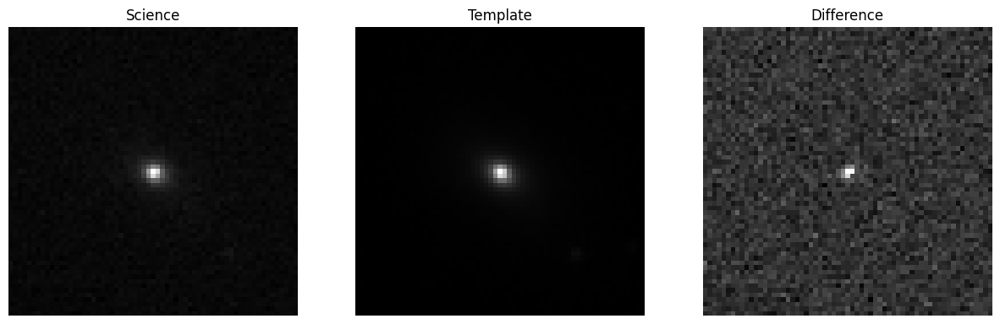

In [45]:
plot_data.plot_image(images[50])

# Plot

# Filter points

# Mag2Flux and NormMjd

# Train GP Kernel

# Gaussian Process

# Norm Flux

# Mask

# Model